In [1]:
import infercnvpy as cnv

import scanpy as sc
import pandas as pd
import infercnvpy as cnv
import numpy as np 

import sys
import os
sys.path.append("/home/augusta/storage3/augusta/insituCNV/InSituCNV")
import insitucnv as icv

import spatialdata as sd
from spatialdata_io import xenium
import spatialdata_plot

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
sc.settings.verbosity = 3   # 0: error, 1: warn, 2: info, 3: hint
import squidpy as sq

/home/augusta/anaconda3/envs/insitucnv_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
Xenium_path_1105_BL = "/home/augusta/storage3/long/projects/Theo-Ioannis Her2/Xenium/1105_BL"
Xenium_path_1105_K2 = "/home/augusta/storage3/long/projects/Theo-Ioannis Her2/Xenium/1105_K2"
Xenium_path_1310_BL = "/home/augusta/storage3/long/projects/Theo-Ioannis Her2/Xenium/1310_BL"
Xenium_path_1310_V2 = "/home/augusta/storage3/long/projects/Theo-Ioannis Her2/Xenium/1310_V2"

In [3]:
sdata_1105_BL = xenium(Xenium_path_1105_BL) 
sdata_1105_K2 = xenium(Xenium_path_1105_K2)
sdata_1310_BL = xenium(Xenium_path_1310_BL)
sdata_1310_V2 = xenium(Xenium_path_1310_V2)

INFO     reading /home/augusta/storage3/long/projects/Theo-Ioannis Her2/Xenium/1105_BL/cell_feature_matrix.h5      
INFO     reading /home/augusta/storage3/long/projects/Theo-Ioannis Her2/Xenium/1105_K2/cell_feature_matrix.h5      
INFO     reading /home/augusta/storage3/long/projects/Theo-Ioannis Her2/Xenium/1310_BL/cell_feature_matrix.h5      
INFO     reading /home/augusta/storage3/long/projects/Theo-Ioannis Her2/Xenium/1310_V2/cell_feature_matrix.h5      


INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   


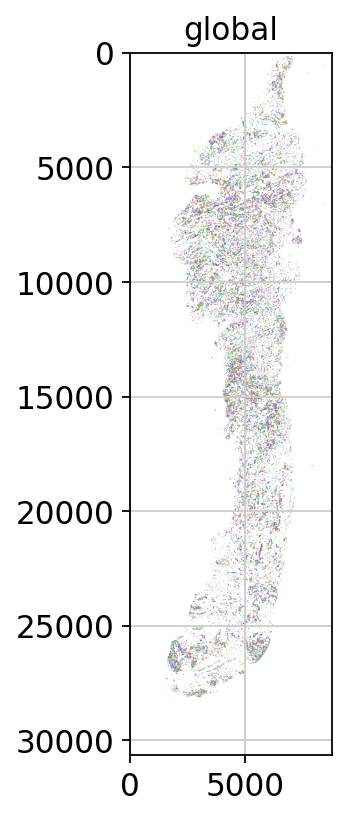

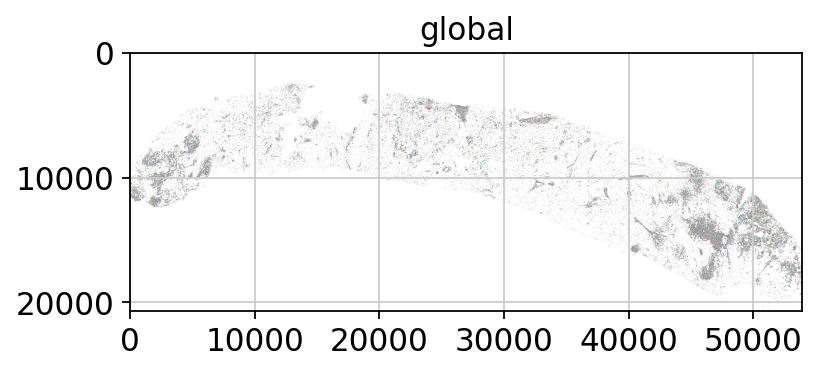

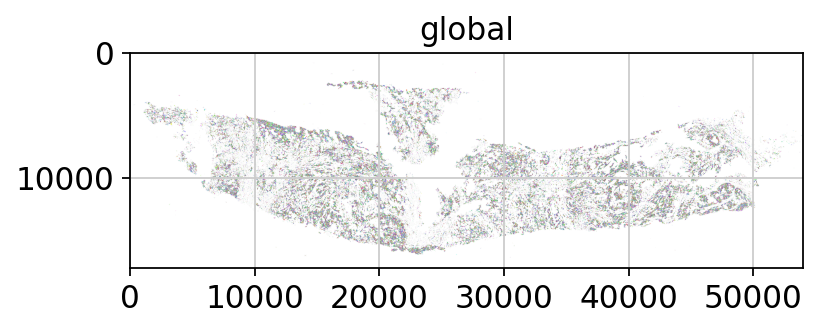

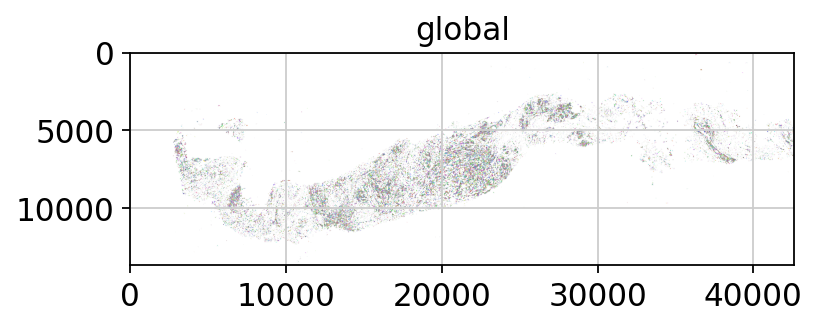

In [4]:
sdata_1105_BL.pl.render_labels().pl.show()
sdata_1105_K2.pl.render_labels().pl.show()
sdata_1310_BL.pl.render_labels().pl.show()
sdata_1310_V2.pl.render_labels().pl.show()

In [5]:
import anndata as ad

adata_1105_BL = sdata_1105_BL["table"].copy()
adata_1105_K2 = sdata_1105_K2["table"].copy()
adata_1310_BL = sdata_1310_BL["table"].copy()
adata_1310_V2 = sdata_1310_V2["table"].copy()

adatas = {
    "1105_BL": adata_1105_BL,
    "1105_K2": adata_1105_K2,
    "1310_BL": adata_1310_BL,
    "1310_V2": adata_1310_V2,
}

# make obs_names unique and add sample column
for sample, a in adatas.items():
    a.obs_names = a.obs_names.astype(str) + f"-{sample}"
    a.obs["sample"] = sample

adata = ad.concat(
    adatas,
    join="inner",        # keep only shared variables (genes/features)
    label="sample",      # will also create/overwrite adata.obs["sample"]
    index_unique=None    # we already made obs_names unique ourselves
)

In [6]:
adata

AnnData object with n_obs × n_vars = 255107 × 5099
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'sample'
    obsm: 'spatial'

## Change spatial coordinates

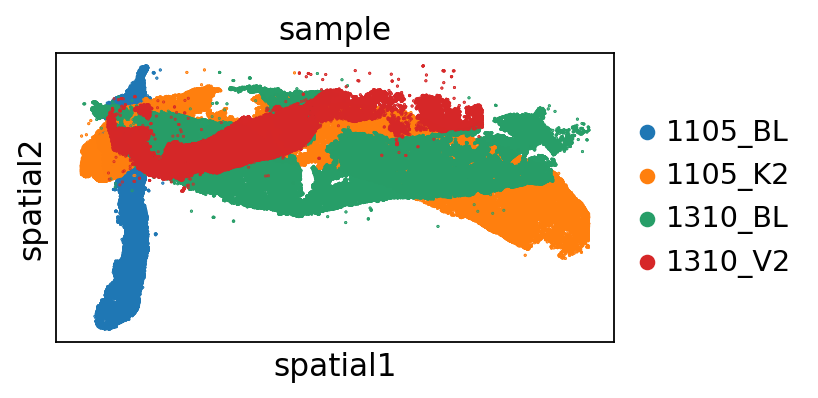

In [7]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color="sample",
)

In [8]:
sp = adata.obsm["spatial"].copy()

# p2n1: +11000 on x
mask = adata.obs["sample"].isin(["1105_K2", "1310_BL", "1310_V2"]).to_numpy()
sp[mask, 0] += 2000

adata.obsm["spatial"] = sp

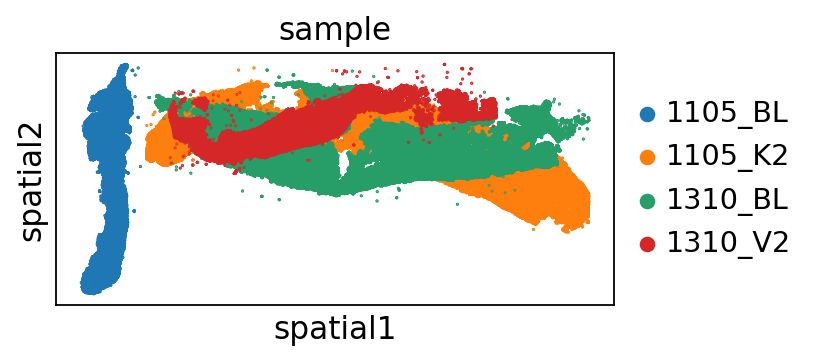

In [9]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color="sample",
)

In [10]:
sp = adata.obsm["spatial"].copy()

# p2n1: +11000 on x
mask = adata.obs["sample"].isin(["1105_K2", "1310_BL", "1310_V2"]).to_numpy()
sp[mask, 0] += 2000

adata.obsm["spatial"] = sp

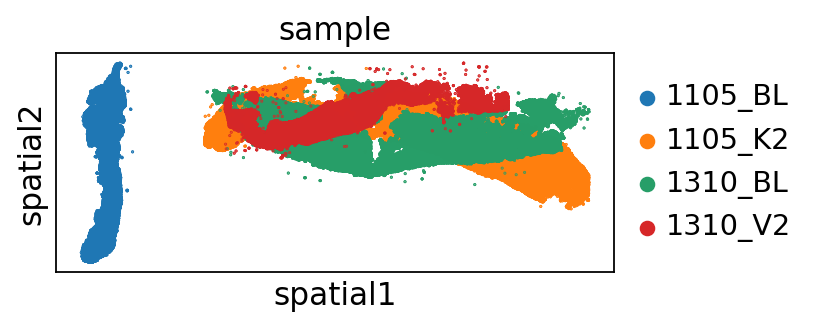

In [11]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color="sample",
)

In [12]:
sp = adata.obsm["spatial"].copy()

# p2n1: +3000 on y (down)
mask = adata.obs["sample"].isin(["1310_BL", "1310_V2"]).to_numpy()
sp[mask, 1] += 3000

adata.obsm["spatial"] = sp

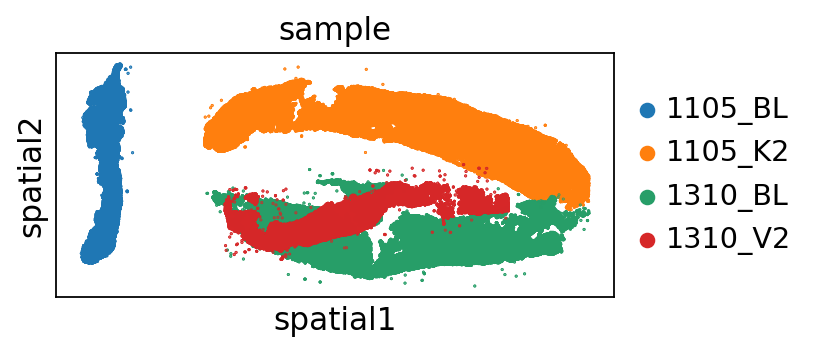

In [13]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color="sample",
)

In [14]:
sp = adata.obsm["spatial"].copy()

# p2n1: +3000 on y (down)
mask = adata.obs["sample"].isin(["1310_V2"]).to_numpy()
sp[mask, 1] += 3000

adata.obsm["spatial"] = sp

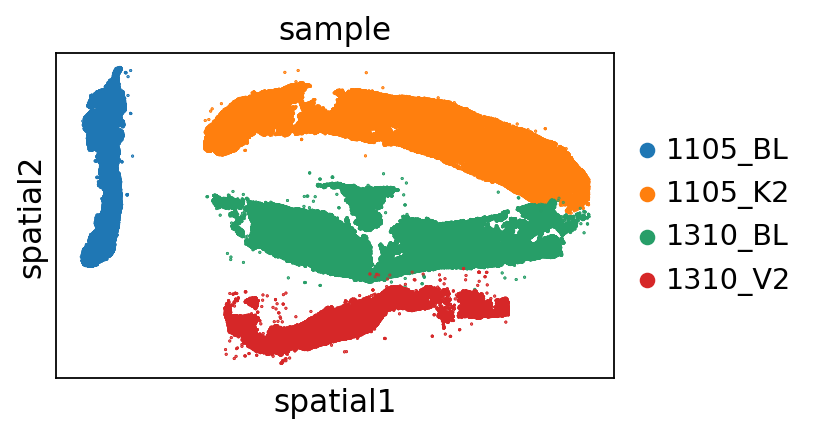

In [15]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color="sample",
)

In [16]:
sp = adata.obsm["spatial"].copy()

# p2n1: +3000 on y (down)
mask = adata.obs["sample"].isin(["1310_BL", "1310_V2"]).to_numpy()
sp[mask, 1] += 1000

adata.obsm["spatial"] = sp

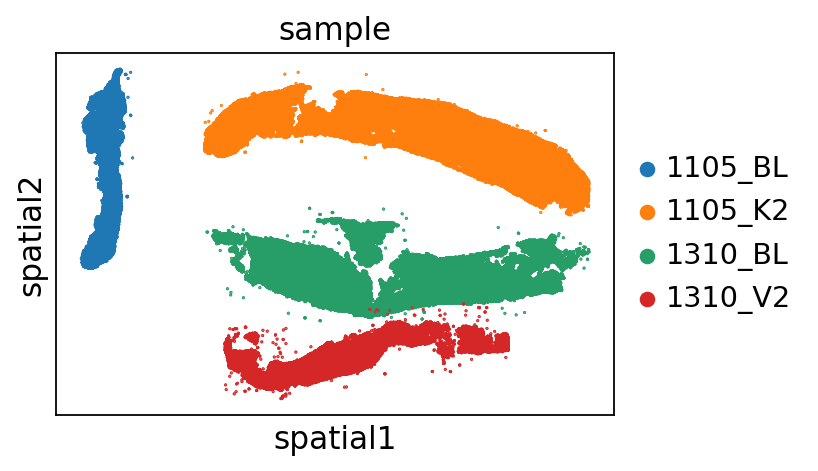

In [17]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color="sample",
)

# QC

In [18]:
sc.pp.calculate_qc_metrics(adata, inplace=True)

In [19]:
cprobes = (
    adata.obs["control_probe_counts"].sum() / adata.obs["total_counts"].sum() * 100
)
cwords = (
    adata.obs["control_codeword_counts"].sum() / adata.obs["total_counts"].sum() * 100
)
print(f"Negative DNA probe count % : {cprobes}")
print(f"Negative decoding count % : {cwords}")

Negative DNA probe count % : 0.0007694063222538568
Negative decoding count % : 0.0015110604264164675


<Axes: title={'center': 'Nucleus ratio'}, ylabel='Count'>

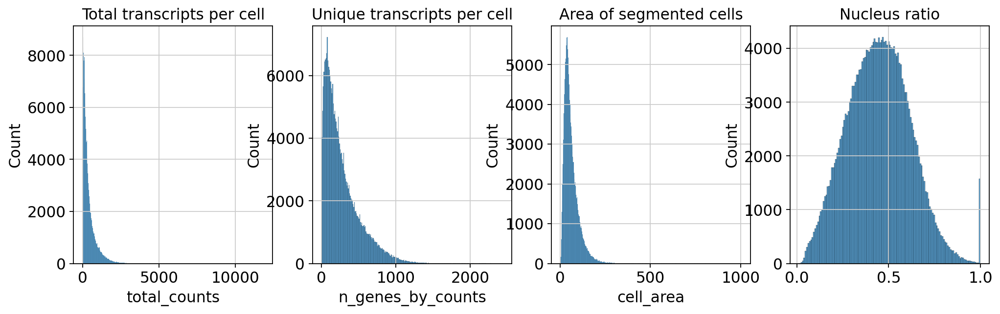

In [20]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    adata.obs["total_counts"],
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    adata.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1],
)


axs[2].set_title("Area of segmented cells")
sns.histplot(
    adata.obs["cell_area"],
    kde=False,
    ax=axs[2],
)

axs[3].set_title("Nucleus ratio")
sns.histplot(
    adata.obs["nucleus_area"] / adata.obs["cell_area"],
    kde=False,
    ax=axs[3],
)

## Filter cells

In [21]:
sc.pp.filter_cells(adata, min_counts=10)
sc.pp.filter_genes(adata, min_cells=5)

filtered out 3611 cells that have less than 10 counts


## Normalize, log transform, reduce dimentionality, compute UMAP

In [22]:
print(adata.X)

<Compressed Sparse Row sparse matrix of dtype 'float32'
	with 70116070 stored elements and shape (251496, 5099)>
  Coords	Values
  (0, 5)	1.0
  (0, 17)	3.0
  (0, 27)	1.0
  (0, 41)	1.0
  (0, 56)	2.0
  (0, 58)	2.0
  (0, 62)	2.0
  (0, 67)	1.0
  (0, 71)	1.0
  (0, 75)	1.0
  (0, 77)	1.0
  (0, 88)	1.0
  (0, 103)	1.0
  (0, 109)	1.0
  (0, 140)	1.0
  (0, 142)	1.0
  (0, 145)	1.0
  (0, 162)	1.0
  (0, 164)	2.0
  (0, 165)	1.0
  (0, 179)	1.0
  (0, 182)	1.0
  (0, 185)	1.0
  (0, 189)	1.0
  (0, 202)	4.0
  :	:
  (251495, 3244)	1.0
  (251495, 3402)	1.0
  (251495, 3508)	1.0
  (251495, 3537)	1.0
  (251495, 3577)	1.0
  (251495, 3619)	1.0
  (251495, 3631)	1.0
  (251495, 3652)	1.0
  (251495, 3709)	1.0
  (251495, 3802)	1.0
  (251495, 3957)	1.0
  (251495, 4021)	1.0
  (251495, 4068)	1.0
  (251495, 4099)	3.0
  (251495, 4168)	1.0
  (251495, 4587)	2.0
  (251495, 4703)	1.0
  (251495, 4758)	1.0
  (251495, 4803)	1.0
  (251495, 4804)	1.0
  (251495, 4856)	1.0
  (251495, 4881)	1.0
  (251495, 4916)	2.0
  (251495, 4943)	1.0

In [23]:
adata.layers["raw_counts"] = adata.X.copy()

In [24]:
sc.pp.normalize_total(adata, inplace=True)

normalizing counts per cell
    finished (0:00:00)


In [25]:
sc.pp.log1p(adata)

In [26]:
adata.layers['log_norm'] = adata.X.copy()

In [27]:
sc.pp.pca(adata)

computing PCA
    with n_comps=50
    finished (0:00:28)


In [28]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:07)


In [29]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:03:39)


In [31]:
sc.tl.leiden(adata, flavor="igraph", directed=False, n_iterations=2)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:19)


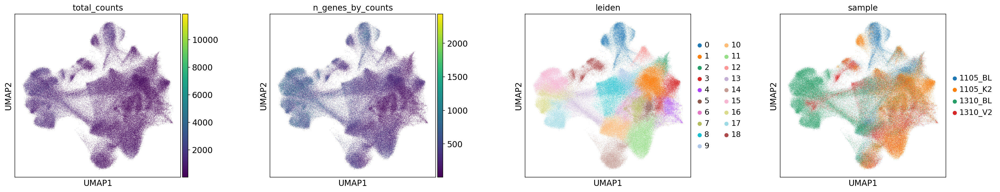

In [32]:
sc.pl.umap(
    adata,
    color=[
        "total_counts",
        "n_genes_by_counts",
        "leiden",
        "sample"
    ],
    wspace=0.4,
)

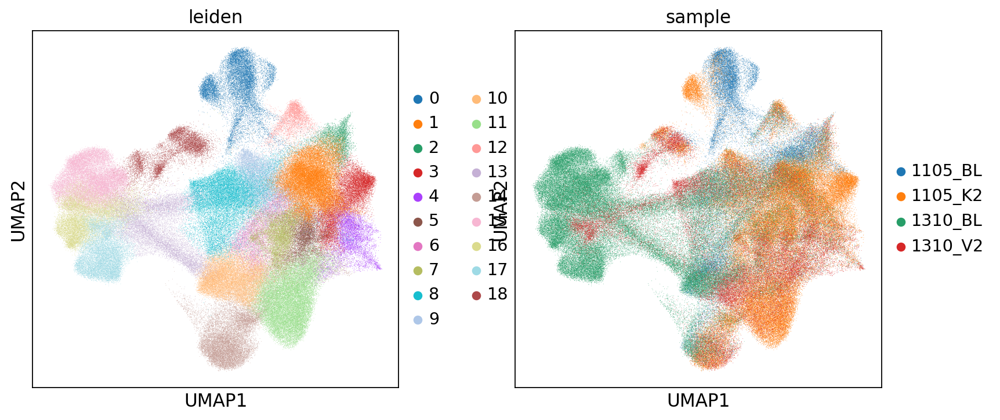

In [33]:
sc.pl.umap(
    adata,
    color=['leiden','sample'],
    wspace=0.2,
)

## Visualize the spatial data

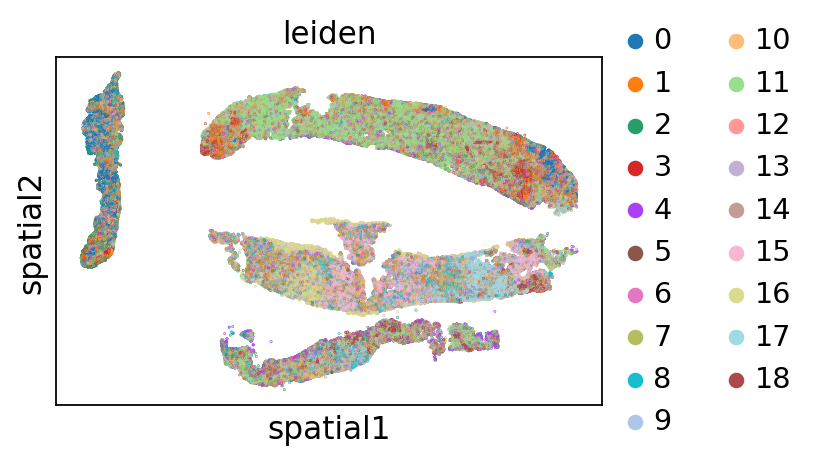

In [34]:
sq.pl.spatial_scatter(
    adata,
    library_id="spatial",
    shape=None,
    color=['leiden'],
    ncols=2,
    size =0.1
)

## Add cell type annotations

In [35]:
celltypes_1105_BL = pd.read_csv("/home/augusta/storage3/augusta/insituCNV/data_from_Kang/sample_selection/cell_types/1105_BL_cell_types.csv")
celltypes_1105_K2 = pd.read_csv("/home/augusta/storage3/augusta/insituCNV/data_from_Kang/sample_selection/cell_types/1105_K2_cell_types.csv")
celltypes_1310_BL = pd.read_csv("/home/augusta/storage3/augusta/insituCNV/data_from_Kang/sample_selection/cell_types/1310_BL_cell_types.csv")
celltypes_1310_V2 = pd.read_csv("/home/augusta/storage3/augusta/insituCNV/data_from_Kang/sample_selection/cell_types/1310_V2_cell_types.csv")

In [ ]:
dfs = [
    celltypes_1105_BL,
    celltypes_1105_K2,
    celltypes_1310_BL,
    celltypes_1310_V2
]

celltypes_all = pd.concat(dfs, ignore_index=True)

In [38]:
celltypes_all.head()

,sampleID,nCount_Xenium,nFeature_Xenium,cell.id,cell_type_oct25
0,1105_BL,910,651,1105_BL_aaaagjbk-1,Epithelial
1,1105_BL,727,494,1105_BL_aaachmja-1,Epithelial
2,1105_BL,522,372,1105_BL_aaaeabhb-1,Epithelial
3,1105_BL,1188,718,1105_BL_aaajopgl-1,Epithelial
4,1105_BL,823,553,1105_BL_aaakbndh-1,Epithelial


In [41]:
adata.obs["cell.id"] = adata.obs["sample"].astype(str) + "_" + adata.obs["cell_id"].astype(str)

In [42]:
adata.obs.head()

,cell_id,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,...,n_genes_by_counts,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,n_counts,leiden,cell.id
0-1105_BL,aaaagjbk-1,910,0,0,0,0,2,910.0,81.461878,24.926251,...,651,6.480045,6.814543,23.406593,34.395604,50.439560,83.406593,910.0,0,1105_BL_aaaagjbk-1
1-1105_BL,aaachmja-1,727,0,0,0,0,2,727.0,68.366565,14.991876,...,494,6.204558,6.590301,30.536451,44.291609,59.559835,100.000000,727.0,0,1105_BL_aaachmja-1
2-1105_BL,aaaeabhb-1,522,0,0,0,0,1,522.0,56.038908,22.036251,...,372,5.921578,6.259582,33.908046,47.892720,67.049808,100.000000,522.0,0,1105_BL_aaaeabhb-1
8-1105_BL,aaaipmhe-1,346,0,0,0,0,0,346.0,60.373908,31.428751,...,276,5.624018,5.849325,34.682081,49.132948,78.034682,100.000000,346.0,0,1105_BL_aaaipmhe-1
9-1105_BL,aaajopgl-1,1188,0,1,0,0,3,1188.0,108.375004,23.165157,...,718,6.577861,7.080868,27.609428,38.888889,55.723906,81.649832,1188.0,0,1105_BL_aaajopgl-1


In [43]:
# Check this first
print(adata.obs["cell.id"].head())
print(celltypes_all["cell.id"].head())

0-1105_BL    1105_BL_aaaagjbk-1
1-1105_BL    1105_BL_aaachmja-1
2-1105_BL    1105_BL_aaaeabhb-1
8-1105_BL    1105_BL_aaaipmhe-1
9-1105_BL    1105_BL_aaajopgl-1
Name: cell.id, dtype: object
0    1105_BL_aaaagjbk-1
1    1105_BL_aaachmja-1
2    1105_BL_aaaeabhb-1
3    1105_BL_aaajopgl-1
4    1105_BL_aaakbndh-1
Name: cell.id, dtype: object


In [44]:
adata.obs = adata.obs.merge(
    celltypes_all[["cell.id", "cell_type_oct25"]],
    on="cell.id",
    how="left"
)

In [45]:
adata.obs.head()

,cell_id,transcript_counts,control_probe_counts,genomic_control_counts,control_codeword_counts,unassigned_codeword_counts,deprecated_codeword_counts,total_counts,cell_area,nucleus_area,...,log1p_n_genes_by_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,n_counts,leiden,cell.id,cell_type_oct25
0,aaaagjbk-1,910,0,0,0,0,2,910.0,81.461878,24.926251,...,6.480045,6.814543,23.406593,34.395604,50.439560,83.406593,910.0,0,1105_BL_aaaagjbk-1,Epithelial
1,aaachmja-1,727,0,0,0,0,2,727.0,68.366565,14.991876,...,6.204558,6.590301,30.536451,44.291609,59.559835,100.000000,727.0,0,1105_BL_aaachmja-1,Epithelial
2,aaaeabhb-1,522,0,0,0,0,1,522.0,56.038908,22.036251,...,5.921578,6.259582,33.908046,47.892720,67.049808,100.000000,522.0,0,1105_BL_aaaeabhb-1,Epithelial
3,aaaipmhe-1,346,0,0,0,0,0,346.0,60.373908,31.428751,...,5.624018,5.849325,34.682081,49.132948,78.034682,100.000000,346.0,0,1105_BL_aaaipmhe-1,NaN
4,aaajopgl-1,1188,0,1,0,0,3,1188.0,108.375004,23.165157,...,6.577861,7.080868,27.609428,38.888889,55.723906,81.649832,1188.0,0,1105_BL_aaajopgl-1,Epithelial


In [61]:
adata.obs['cell_type_oct25'].value_counts()

cell_type_oct25
Epithelial     56233
Fibroblast     42248
T_cells        23405
Myeloid        18798
B_cells         9568
Endothelial     7051
PVLs            5936
Plasma          2536
Adipocytes      1489
Name: count, dtype: int64

In [68]:
immune = ["T_cells", "B_cells", "Myeloid", "Plasma"]
stromal = ["Fibroblast", "Endothelial", "Adipocytes", "PVLs"]
epithelial = ['Epithelial']

adata.obs["compartment"] = "Other"
adata.obs.loc[adata.obs["cell_type_oct25"].isin(immune), "compartment"] = "immune"
adata.obs.loc[adata.obs["cell_type_oct25"].isin(stromal), "compartment"] = "stromal"
adata.obs.loc[adata.obs["cell_type_oct25"].isin(epithelial), "compartment"] = "epithelial"


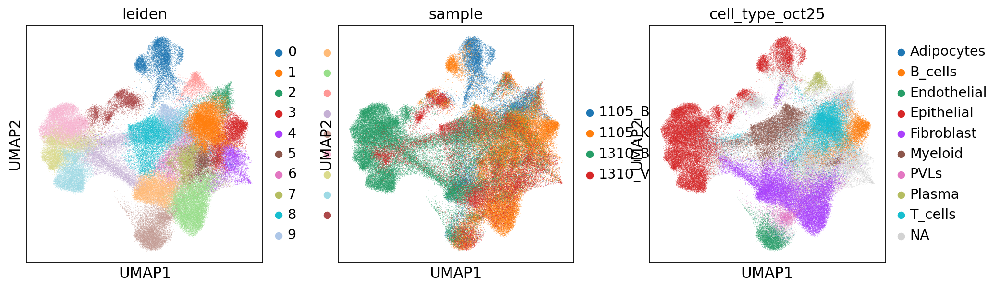

In [60]:
sc.pl.umap(
    adata,
    color=['leiden','sample', 'cell_type_oct25'],
    wspace=0.2
)

In [62]:
print("Total cells:", adata.n_obs)
print("Cells with annotation:", adata.obs["cell_type_oct25"].notna().sum())
print("Cells removed:", adata.obs["cell_type_oct25"].isna().sum())

Total cells: 251496
Cells with annotation: 167264
Cells removed: 84232


In [63]:
## Drop NA cells
adata = adata[adata.obs["cell_type_oct25"].notna()].copy()

In [64]:
# Set default figure size globally for matplotlib (width, height in inches)
plt.rcParams['figure.figsize'] = (16, 16)  # Adjust as needed

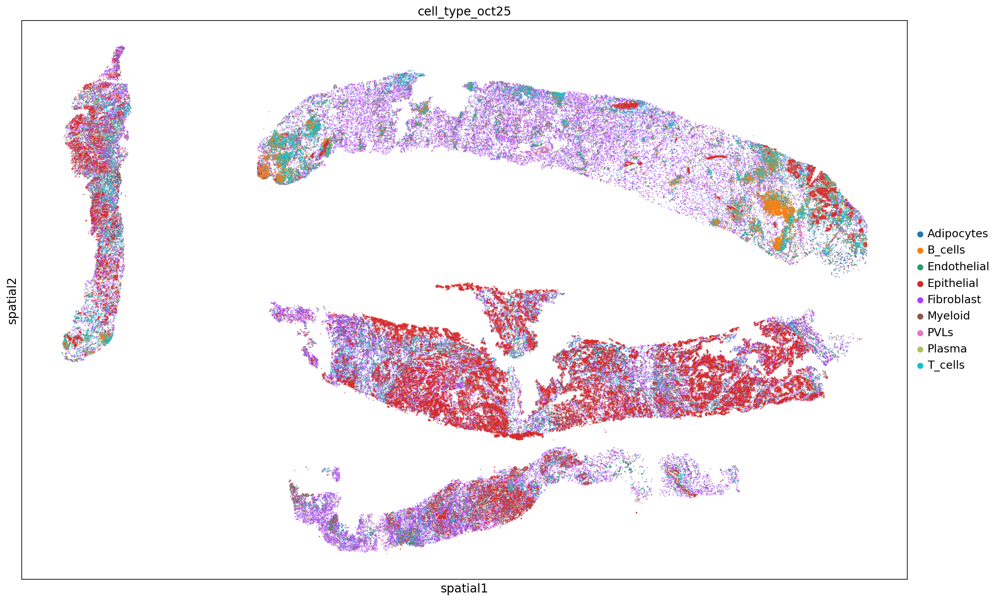

In [72]:
sq.pl.spatial_scatter(
    adata,
    color=["cell_type_oct25"],
    library_id="spatial",
    size=0.1,
    shape=None,
    save = "spatial_all_samples_cell_type_oct25.pdf"
)

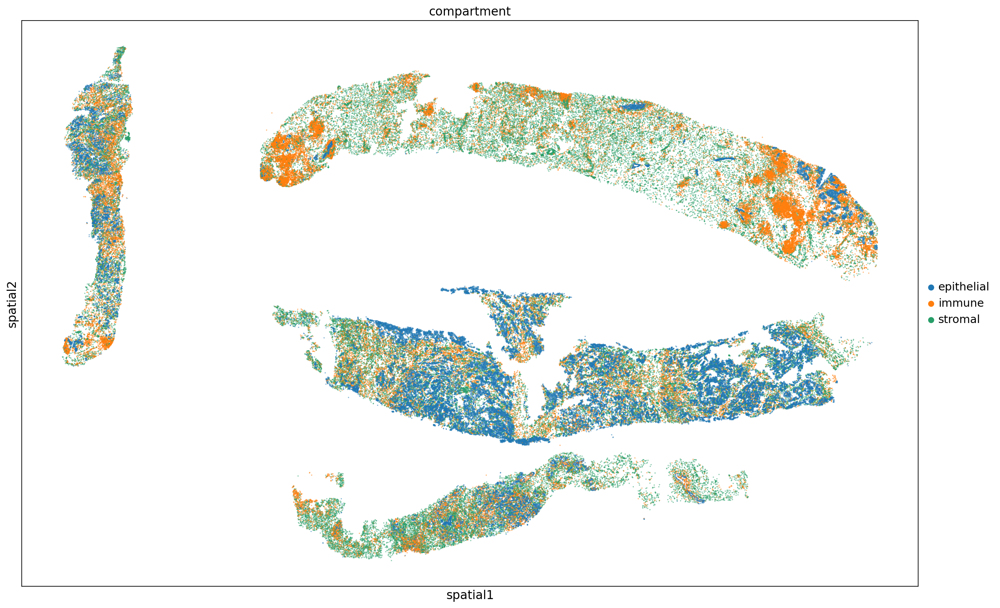

In [71]:
sq.pl.spatial_scatter(
    adata,
    color=["compartment"],
    library_id="spatial",
    size=0.1,
    shape=None,
    save="spatial_all_samples_compartment.pdf"
)

In [65]:
adata

AnnData object with n_obs × n_vars = 167264 × 5099
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts', 'leiden', 'cell.id', 'cell_type_oct25'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'sample_colors', 'log1p', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'cell_type_oct25_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw_counts', 'log_norm'
    obsp: 'distances', 'connectivities'

In [73]:
adata.write("/home/augusta/storage3/augusta/insituCNV/InSituCNV/Breast_cancer_Xenium5K/00_Preprocessing/data/all_samples_preprocessed_celltype_annot.h5ad", compression = "gzip")

In [2]:
adata = sc.read("/home/augusta/storage3/augusta/insituCNV/InSituCNV/Validation/all_validation_samples.h5ad")